In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/augmented-reality-video/ex2_2.jpg
/kaggle/input/augmented-reality-video/pano_image2.jpg
/kaggle/input/augmented-reality-video/pano_image1.jpg
/kaggle/input/augmented-reality-video/ar_source.mov
/kaggle/input/augmented-reality-video/shanghai-23.png
/kaggle/input/augmented-reality-video/ex2_1.jpg
/kaggle/input/augmented-reality-video/cv_cover.jpg
/kaggle/input/augmented-reality-video/ex3_2.png
/kaggle/input/augmented-reality-video/book.mov
/kaggle/input/augmented-reality-video/ex3_1.png
/kaggle/input/augmented-reality-video/shanghai-21.png
/kaggle/input/augmented-reality-video/shanghai-22.png


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg
from tqdm import tqdm
import math

In [3]:
def loadVid(path):
	# Create a VideoCapture object and read from input file
	# If the input is the camera, pass 0 instead of the video file name
	cap = cv2.VideoCapture(path)
	 
	# Check if camera opened successfully
	if (cap.isOpened()== False): 
		print("Error opening video stream or file")

	i = 0
	fps = cap.get(cv2.CAP_PROP_FPS)
	# Read until video is completed
	while(cap.isOpened()):
		# Capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:

			#Store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)
			
		else: 
			break
	 
	# When everything done, release the video capture object
	cap.release()

	return frames,fps

In [4]:
def RGB_video_frames(video_frames):
    
    RGB_frames = []
    
    for frame in video_frames:
        RGB_frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        
    return RGB_frames

In [5]:
def create_video(file_path, frames, fps):
    h, w = np.array(frames[0]).shape[0], np.array(frames[0]).shape[1]
    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
    writer = cv2.VideoWriter(file_path, fourcc, fps, (w, h))
    for frame in frames:
        writer.write(frame)
    writer.release()

# **Part I**

# **1.1 Getting Correspondences**

In [6]:
def get_SIFT_descriptor(img):
    
    # Convert the img to grayscale representation
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply the SIFT descriptor
    sift = cv2.SIFT_create()
    key_points, descriptor = sift.detectAndCompute(gray_img, None)
    
    # Draw the keyPoints on the original image
    key_img = cv2.drawKeypoints(img, key_points, 0)
    
    
    return key_points, descriptor, key_img
    

In [7]:
def get_correspondences(descriptor1, descriptor2, num_of_correspondences):
    
    # Get correspondences between the 2 descriptors
    brute_force_matcher = cv2.BFMatcher()
    matches = brute_force_matcher.knnMatch(descriptor1, descriptor2, k = 2)
    
    # Calculate the ratios and sort it based on the ratio value between the first and second best matches
    ratios = []
    for (best, second) in matches:
        ratios.append((best.distance / second.distance, best))
    ratios = sorted(ratios, key = lambda x : x[0])
    ratios = ratios[0 : num_of_correspondences]
    
    # Get the required num of correspondences 
    correspondences = [x[1] for x in ratios]
    
    return correspondences
    
    

# **1.2 Compute the Homography Parameters**

In [8]:
def get_matches_coordinates(keyPoints1, keyPoints2, matches):
    img1_coord, img2_coord = [], []
    
    # get the coordinates of each correspondence from the 2 images 
    for match in matches:
        i = match.queryIdx
        img1_coord.append(keyPoints1[i].pt)
        j = match.trainIdx
        img2_coord.append(keyPoints2[j].pt)
    
    return img1_coord, img2_coord
    
    

In [9]:
def construct_A_matrix(img1_points, img2_points, n):
    
    # if we have n correspondencs then A matrix should be 2n x 9 
    A = np.zeros((2 * n, 9))
    
    # construct the A matrix as mentioned in the lecture
    for i in range(n):
        (x1, y1) = img1_points[i]
        (x2, y2) = img2_points[i]
        A[2 * i] = [-x1, -y1, -1, 0, 0, 0, x1 * x2, y1 * x2, x2]
        A[(2 * i) + 1] = [0, 0, 0, -x1, -y1, -1, x1 * y2, y1 * y2, y2]
        
    return A 
    
    

In [10]:
def compute_homography_matrix(mat_A):
    
    # solvimg using singular value decomposition
    U, lamb, V = linalg.svd(mat_A)
    # choosing the eigenvector corresponding to the smallest eigenvalue
    homography_mat = (V[-1,:] / V[-1,-1]).reshape((9, 1))
    # reshaping the matrix to be 3x3 with homography_mat(3, 3) = 1
    homography_mat = homography_mat.reshape(3, 3)
    
    return homography_mat
    

# **1.3 Calcualte Book Coordinates**

In [11]:
def get_book_corners(homography_mat, corners):
    
    new_corners = []
    
    # for each point in the list multiply it by the homography matrix to get its corresponding point in the video frame
    # Handling heterogeneous and homogeneous coordinates by dividing by the last value in the resulted vector 
    for corner in corners :
        corner_point = corner.copy()
        corner_point.append(1)
        corner_point = np.array(corner_point).reshape((3, 1))
        new_corner = np.matmul(homography_mat, corner_point)
        new_corner /= new_corner[-1]
        new_corners.append(new_corner[0:2].T)
    
    # rounding returned values to represent pixels values 
    new_corners = np.array(new_corners).squeeze()
    new_corners = [(i,j) for i,j in np.round(new_corners).astype('int64')]
    return new_corners
    

In [12]:
def draw_book_corners(corners, img):
    
    img_with_corners = img.copy()
    img_with_corners = cv2.line(img_with_corners, corners[0],corners[1], (255, 0, 0) , 2, cv2.LINE_AA)
    img_with_corners = cv2.line(img_with_corners, corners[0],corners[2], (255, 0, 0) , 2, cv2.LINE_AA)
    img_with_corners = cv2.line(img_with_corners, corners[1],corners[3], (255, 0, 0) , 2, cv2.LINE_AA)
    img_with_corners = cv2.line(img_with_corners, corners[2],corners[3], (255, 0, 0) , 2, cv2.LINE_AA)
    
    return img_with_corners

# **Verification Part**

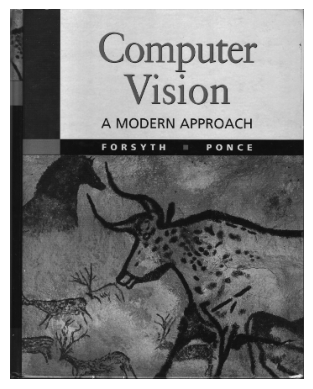

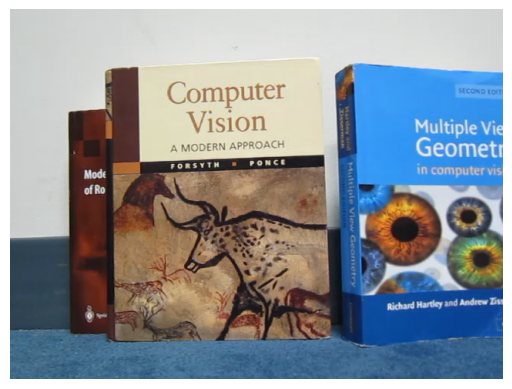

In [13]:
book_frames,fps1 = loadVid("/kaggle/input/augmented-reality-video/book.mov")
book_cover = cv2.imread("/kaggle/input/augmented-reality-video/cv_cover.jpg")
book_frames = RGB_video_frames(book_frames)

plt.imshow(book_cover)
plt.axis('off')
plt.show()

plt.imshow(book_frames[0])
plt.axis('off')
plt.show()


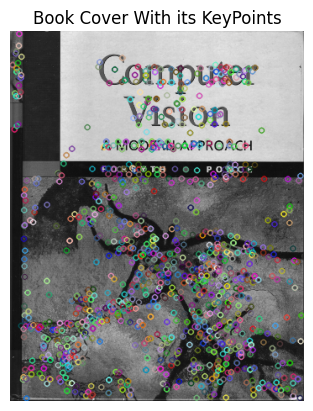

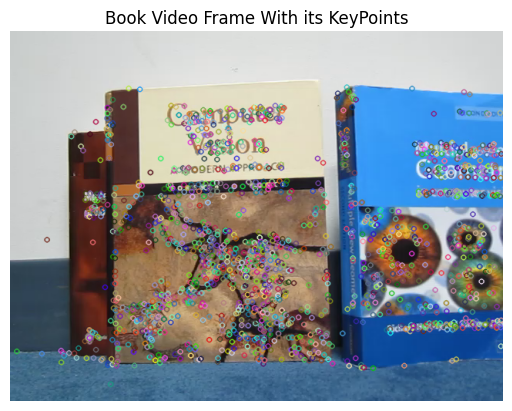

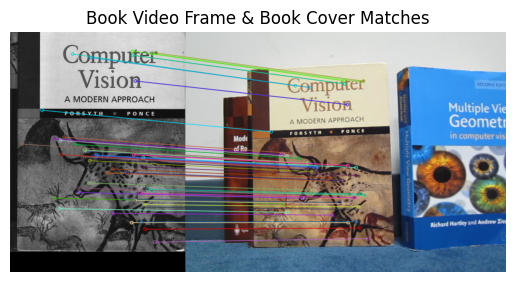


Calculated Homography Matrix:
[[ 7.78722595e-01  4.93836737e-03  1.18741059e+02]
 [-4.93210892e-02  7.82328344e-01  7.71285287e+01]
 [-8.29059112e-05 -6.96961268e-05  1.00000000e+00]]

Built-in Homography Matrix:
[[ 7.79432251e-01  5.20232631e-03  1.18667680e+02]
 [-4.89270304e-02  7.82905732e-01  7.70361850e+01]
 [-8.16348498e-05 -6.89002356e-05  1.00000000e+00]]

Transformed Corners Points Using Our Calculated Homography Matrix: [(119, 77), (402, 62), (125, 434), (418, 429)]

Transformed Corners Points Using Built-in Homography Matrix:       [(119, 77), (402, 62), (125, 434), (417, 429)]



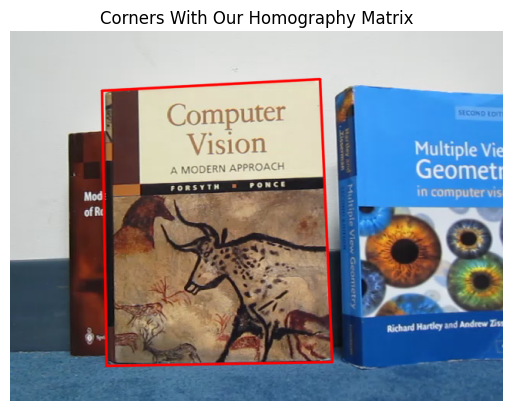

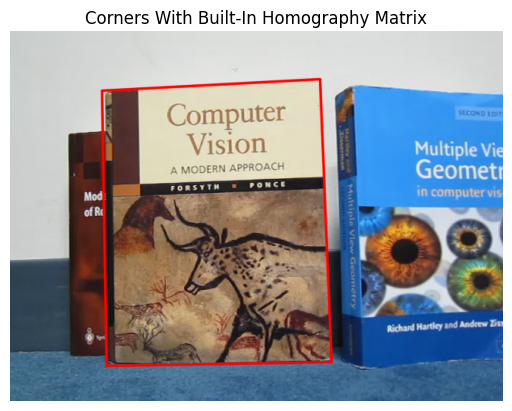

In [14]:

cover_keyPoints, cover_descriptor, cover_with_keyPoints = get_SIFT_descriptor(book_cover)
frame_keyPoints, frame_descriptor, frame_with_KeyPoints = get_SIFT_descriptor(book_frames[0])

plt.imshow(cover_with_keyPoints)
plt.axis('off')
plt.title("Book Cover With its KeyPoints")
plt.show()

plt.imshow(frame_with_KeyPoints)
plt.axis('off')
plt.title("Book Video Frame With its KeyPoints")
plt.show()

correspondences = get_correspondences(cover_descriptor, frame_descriptor, 50)

img_with_matches = cv2.drawMatches(book_cover, cover_keyPoints, book_frames[0], frame_keyPoints, correspondences, 0, flags = 2)

plt.imshow(img_with_matches)
plt.title("Book Video Frame & Book Cover Matches")
plt.axis('off')
plt.show()

img1, img2 = get_matches_coordinates(cover_keyPoints, frame_keyPoints, correspondences)

A = construct_A_matrix(img1, img2, 50)
H = compute_homography_matrix(A)
print(f"\nCalculated Homography Matrix:\n{H}\n")


built_in_h, status = cv2.findHomography(np.array(img1), np.array(img2))
print(f"Built-in Homography Matrix:\n{built_in_h}\n")

corners = [[0, 0], [book_cover.shape[1] - 1,0], [0, book_cover.shape[0] - 1], [book_cover.shape[1] - 1, book_cover.shape[0] - 1]]

new_corners = get_book_corners(H, corners)
print(f"Transformed Corners Points Using Our Calculated Homography Matrix: {new_corners}\n")

built_in_corners = get_book_corners(built_in_h, corners)
print(f"Transformed Corners Points Using Built-in Homography Matrix:       {built_in_corners}\n")


book_with_frame = draw_book_corners(new_corners, book_frames[0])
built_in_book_with_frame = draw_book_corners(built_in_corners, book_frames[0])

plt.imshow(book_with_frame)
plt.title("Corners With Our Homography Matrix")
plt.axis('off')
plt.show()


plt.imshow(built_in_book_with_frame)
plt.title("Corners With Built-In Homography Matrix")
plt.axis('off')
plt.show()


In [15]:
def check_with_selected_point(matches, h_mat, point, key1, key2):
    
    coor1, coor2 = get_matches_coordinates(key1, key2, matches)
    point = np.array(point).transpose()
    
    built_in_h, status = cv2.findHomography(np.array(coor1), np.array(coor2))
    
    built_in_p = np.matmul(built_in_h, point)
    built_in_p /= built_in_p[-1]
    p = np.matmul(h_mat, point)
    p /= p[-1]
    
    print(f"\nTransformed Point with Calculated Homography: {p}\n")
    print(f"Transformed Point with Built-in Homography:   {built_in_p}\n")
    
    if sum(abs(p - built_in_p)) / 2 < 1:
        print("Acceptable Range\n")
        
    else:
        print("Too far off!\n")
        return False
        
    
    return True
    

In [16]:
check_with_selected_point(correspondences, H, [100, 100, 1], cover_keyPoints, frame_keyPoints)


Transformed Point with Calculated Homography: [200.16166317 152.76040916   1.        ]

Transformed Point with Built-in Homography:   [200.14400723 152.73322605   1.        ]

Acceptable Range



True

# 1.4 Crop AR Video Frames

511
(360, 640, 3)


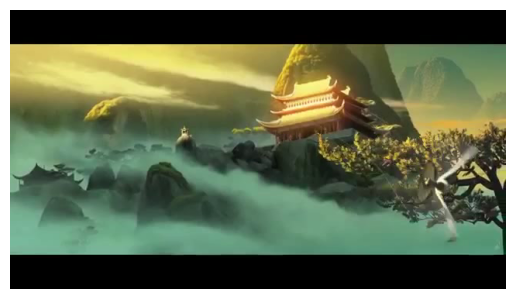

In [17]:
panda_frames,fps2=loadVid("/kaggle/input/augmented-reality-video/ar_source.mov")
panda_frames=RGB_video_frames(panda_frames)
print(len(panda_frames))
print(panda_frames[0].shape)
plt.imshow(panda_frames[1])
plt.axis('off')
plt.show()

crop the top and down black border

top black border


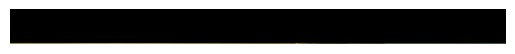

down black border


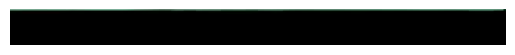

frame without borders


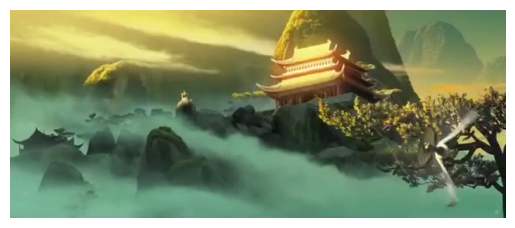

In [18]:
print("top black border")
plt.imshow(panda_frames[0][0:45])
plt.axis('off')
plt.show()
print("down black border")
plt.imshow(panda_frames[0][314:])
plt.axis('off')
plt.show()
print("frame without borders")
plt.imshow(panda_frames[0][45:314])
plt.axis('off')
plt.show()

In [19]:
def resized_withoutborders(img,start=45,end=314):
    return cv2.resize(img[start:end], (book_frames[0].shape[1] , book_frames[0].shape[0]), interpolation = cv2.INTER_LINEAR)
    

(480, 640, 3)


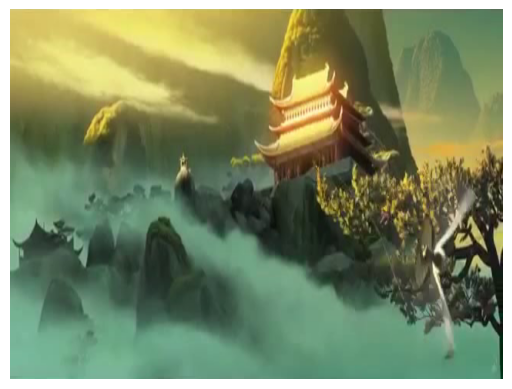

In [20]:

cropeed_resized_img=resized_withoutborders(panda_frames[0])
plt.imshow(cropeed_resized_img)
print(cropeed_resized_img.shape)
plt.axis('off')
plt.show()

In [21]:
def centered_frame(frame, book_img):
    
    center = (frame.shape[0]//2,frame.shape[1]//2)
    img_copy  = frame[:,center[1]-book_img.shape[1]//2:center[1]+book_img.shape[1]//2]
    return img_copy

(480, 350, 3)


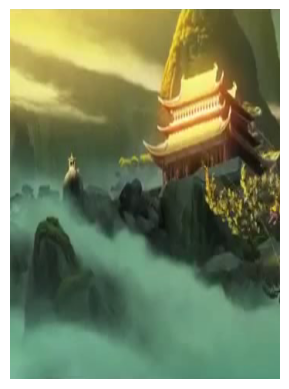

(440, 350, 3)


In [22]:
centered_img=centered_frame(cropeed_resized_img,book_cover)
plt.imshow(centered_img)
print(centered_img.shape)
plt.axis('off')
plt.show()
print(book_cover.shape)

# 1.5 Overlay the First Frame of the Two Videos


In [23]:
def overlay(overlay_image, original_image, H):
  indices = [[i,j] for i in range(overlay_image.shape[1]) for j in range(overlay_image.shape[0])]
  new_points = get_book_corners(H,indices)
  copy_image = original_image.copy()
  for i,(x,y) in enumerate(new_points):
    [x2,y2] = indices[i]
    if round(x) < original_image.shape[1] and round(y) < original_image.shape[0] and round(x) > 0 and round(y) > 0:
      copy_image[round(y),round(x)] = overlay_image[y2,x2]
  return copy_image

# 1.6 Creating AR Application

In [24]:
def ar_application():
    keypoints1, descriptors1, sift_image1 = get_SIFT_descriptor(book_cover)
    corners = [[0,0],[book_cover.shape[1]-1,0],[0,book_cover.shape[0]-1],[book_cover.shape[1]-1,book_cover.shape[0]-1]]
    frames_stack = []

    for i in tqdm(range(len(book_frames))):
        

        #get data from sift discriptor of the book frame
        keypoints2, descriptors2,sift_image2 = get_SIFT_descriptor(book_frames[i])
        matches = get_correspondences(descriptors1, descriptors2,300)
        #get matches between book cover and book frame
        image1_points , image2_points = get_matches_coordinates(keypoints1,keypoints2,matches)
        A =construct_A_matrix(image1_points,image2_points,15)
        H = compute_homography_matrix(A)
        
        if(i<len(panda_frames)):
            j=i;
        else:
            j=len(panda_frames)-1
            
        #remove black borders from panda frame and resize the frame to the same dimentions as the bookframe
        cropeed_resized_img=resized_withoutborders(panda_frames[j])
        #from the center of the panda frame ,its cropped so it has the same width of the book
        centered_img=centered_frame(cropeed_resized_img,book_cover)

        #overlay the centered image on the book frame using homography
        final_frame = overlay(centered_img,book_frames[i],H)

        frames_stack.append(final_frame)
    return frames_stack  
        
    


In [25]:
frames_stack=ar_application()


100%|██████████| 641/641 [28:26<00:00,  2.66s/it]


In [26]:
final_panda_book=RGB_video_frames(frames_stack)
create_video("/kaggle/working/final_ar.mov",final_panda_book,fps1)

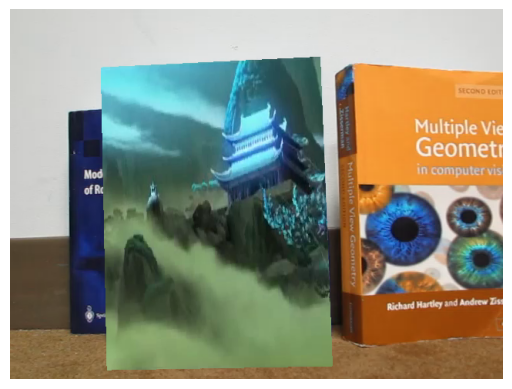

In [27]:
plt.imshow(final_panda_book[0])

plt.axis('off')
plt.show()

# Part 2: Image Mosaics

In [28]:
image1= cv2.imread("/kaggle/input/augmented-reality-video/pano_image2.jpg")
image2= cv2.imread("/kaggle/input/augmented-reality-video/pano_image1.jpg")

In [29]:
print(image1.shape)
print(image2.shape)

(683, 1024, 3)
(683, 1024, 3)


# 2.1 Getting Correspondences and Compute the Homography Pa-rameters

In [30]:
image1_keyPoints, image1_descriptor, image1_with_keyPoints = get_SIFT_descriptor(image1)
image2_keyPoints, image2_descriptor, image2_with_KeyPoints = get_SIFT_descriptor(image2)

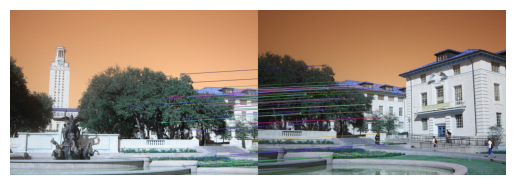

In [31]:
correspondences_between_2images = get_correspondences(image1_descriptor, image2_descriptor, 50)

Twoimages_with_matches = cv2.drawMatches(image1, image1_keyPoints, image2, image2_keyPoints, correspondences_between_2images, 0, flags = 2)

plt.imshow(Twoimages_with_matches)
plt.axis('off')
plt.show()

In [32]:
image1_pt2, image2_pt2 = get_matches_coordinates(image1_keyPoints, image2_keyPoints, correspondences_between_2images)
print(len(image1_pt2))
print(len(image2_pt2))
A_matrix_pt2 = construct_A_matrix(image1_pt2, image2_pt2, 50)
H_pt2 = compute_homography_matrix(A_matrix_pt2)
print("Computed h\n", H_pt2)
built_in_h_pt2, status_pt2 = cv2.findHomography(np.array(image1_pt2), np.array(image2_pt2))
print(f"Built-in Homography Matrix:\n{built_in_h_pt2}\n")

50
50
Computed h
 [[ 1.29012454e+00 -7.46345485e-02 -5.70358415e+02]
 [ 1.66984726e-01  1.21135532e+00 -1.65497059e+02]
 [ 2.70297884e-04  2.07980155e-05  1.00000000e+00]]
Built-in Homography Matrix:
[[ 1.28820009e+00 -7.46759764e-02 -5.69291740e+02]
 [ 1.66348137e-01  1.20989483e+00 -1.64907038e+02]
 [ 2.68836960e-04  2.03604780e-05  1.00000000e+00]]



# 2.2 Warping Between Image Planes

In [33]:
def get_corresponding(h, point):
  point = np.transpose([point[0], point[1], 1])
  new_point = np.dot(h, point) 
  # normalize to obtain heterogenous system
  new_point /= new_point[2]
  return (new_point[0],new_point[1])

def forward_warping(image, H):
    height,width = image.shape[0],image.shape[1]
    image_corners=[[0,0],[width-1,0],[0,height-1],[width-1,height-1]]
    
    image_new_corner1=get_corresponding(H,image_corners[0])
    image_new_corner2=get_corresponding(H,image_corners[1])
    image_new_corner3=get_corresponding(H,image_corners[2])
    image_new_corner4=get_corresponding(H,image_corners[3])
    
    #get corners of new frame
    MIN_X,MIN_Y =min(image_new_corner1[0],image_new_corner2[0],image_new_corner3[0],image_new_corner4[0]),min(image_new_corner1[1],image_new_corner2[1],image_new_corner3[1],image_new_corner4[1])
    MAX_X,MAX_Y=max(image_new_corner1[0],image_new_corner2[0],image_new_corner3[0],image_new_corner4[0]) ,max(image_new_corner1[1],image_new_corner2[1],image_new_corner3[1],image_new_corner4[1])
    #print(MIN_X, MIN_Y,MAX_X,MAX_Y)
    Result_warp_image = np.zeros((math.ceil(MAX_Y - MIN_Y), math.ceil(MAX_X - MIN_X), 3), dtype=np.uint8)
    for y in range(height):
         for x in range(width):
            P = get_corresponding(H,(x,y))
            #if(int(P[1])>=math.ceil(MAX_Y ) or int(P[0] )>= math.ceil(MAX_X ) ):continue
            Result_warp_image[int(P[1] - MIN_Y), int(P[0] - MIN_X)] = image[y, x]
    plt.imshow(cv2.cvtColor(Result_warp_image, cv2.COLOR_BGR2RGB))
    plt.title("Forward warping result ")
    plt.axis('off')
    plt.show() 
    shiftX,shiftY=MIN_X,MIN_Y
    return Result_warp_image,(MIN_X,MIN_Y ),(MAX_X,MAX_Y) 

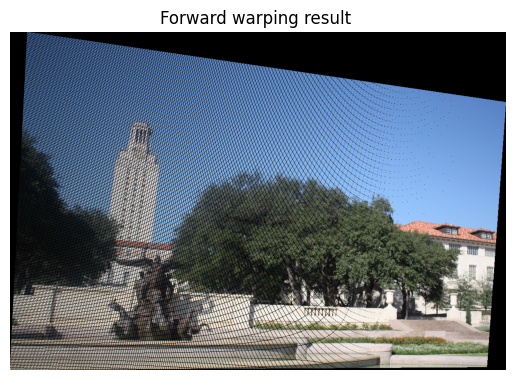

In [34]:
forward_warp,x,y=forward_warping(image1 ,H_pt2)

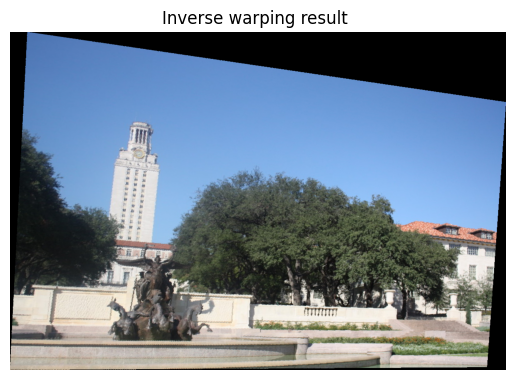

In [35]:
def interpolation(x,y,image) : 
    x1 = math.floor(x)
    x2 = math.ceil(x)
    y1 = math.floor(y)
    y2 = math.ceil(y)
    w1 = (abs(y-y2))*(abs(x-x2))*image[y1][x1]
    w2 = (abs(y-y1))*(abs(x-x1))*image[y2][x2]
    w3 = (abs(y-y1))*(abs(x-x2))*image[y1][x2]
    w4 = (abs(y-y2))*(abs(x-x1))*image[y2][x1]

    return w1+w2+w3+w4

def Inverse_warping(H,image,warped_image,min_corner,max_corner):
    h_inverse = np.linalg.inv(H)
    
    #Removing holes
    for i in range(int(min_corner[0]),int( max_corner[0])):
        for j in range(int(min_corner[1]),int( max_corner[1])):
          new_point = get_corresponding(h_inverse, (i, j))
          
          # if the corresponding is out of the image border,skip it
          if new_point[0] < 0 or new_point[0] > image.shape[1]-1 or new_point[1] < 0 or new_point[1] > image.shape[0]-1:
            continue
          new_x = abs(int(min_corner[0]) - i)
          new_y = abs(int(min_corner[1]) - j)
          warped_image[new_y][new_x]=interpolation(new_point[0],new_point[1],image)
            
    plt.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
    plt.title("Inverse warping result ")
    plt.axis('off')
    plt.show()
    return warped_image 
inversed_warp=Inverse_warping(H_pt2,image1,forward_warp,x,y)

# 2.3 Create the output mosaic

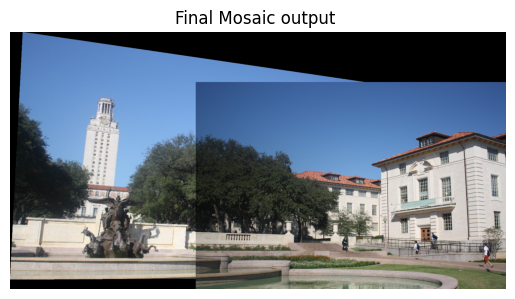

In [36]:
def Mosaic(image1,image2,left_shift, bottom_shift):
    warp_shift_x,warp_shift_y = max(0, round(left_shift)), max(0, round(bottom_shift))
    img2_shift_x,img2_shift_y = max(0, round(-left_shift)), max(0, round(-bottom_shift))
    
    img1_height,img1_width= image1.shape[0],image1.shape[1]
    img2_height,img2_width= image2.shape[0],image2.shape[1]
    
    height = max(warp_shift_y + img1_height , img2_shift_y + img2_height)
    width =  max(warp_shift_x + img1_width ,  img2_shift_x + img2_width)
    final = np.zeros((height, width,3))  

    final[warp_shift_y : warp_shift_y+img1_height, warp_shift_x : warp_shift_x+img1_width ] = image1
    final[img2_shift_y : img2_shift_y+img2_height, img2_shift_x : img2_shift_x+img2_width ] = image2  


    final = final.astype(np.uint8)
    plt.imshow(cv2.cvtColor(final, cv2.COLOR_BGR2RGB))
    plt.title("Final Mosaic output ")
    plt.axis('off')
    plt.show()
    return final

out=Mosaic(inversed_warp,image2,x[0],x[1])    

In [37]:
def final_stitch_steps(image1,image2):
    figure, axis = plt.subplots(1, 2, figsize=(10, 10), gridspec_kw={'width_ratios': [2, 2]})
    axis[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    axis[0].axis("off")
    axis[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
    axis[1].axis("off")
    plt.show()
    
    image1_keyPoints, image1_descriptor, image1_with_keyPoints = get_SIFT_descriptor(image1)
    image2_keyPoints, image2_descriptor, image2_with_KeyPoints = get_SIFT_descriptor(image2)
    correspondences_between_2images = get_correspondences(image1_descriptor, image2_descriptor, 50)

    Twoimages_with_matches = cv2.drawMatches(image1, image1_keyPoints, image2, image2_keyPoints, correspondences_between_2images, 0, flags = 2)

    plt.imshow(cv2.cvtColor(Twoimages_with_matches, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    image1_pt2, image2_pt2 = get_matches_coordinates(image1_keyPoints, image2_keyPoints, correspondences_between_2images)

    A_matrix_pt2 = construct_A_matrix(image1_pt2, image2_pt2, 50)
    H_pt2 = compute_homography_matrix(A_matrix_pt2)
    print("Calculated H\n", H_pt2)
    built_in_h_pt2, status_pt2 = cv2.findHomography(np.array(image1_pt2), np.array(image2_pt2))
    print(f"\nBuilt-in Homography Matrix:\n{built_in_h_pt2}\n")
    
    forward_warp,x,y=forward_warping(image2 ,H_pt2)
    inversed_warp=Inverse_warping(H_pt2,image1,forward_warp,x,y)
    out=Mosaic(inversed_warp,image2,x[0],x[1])
    return out;

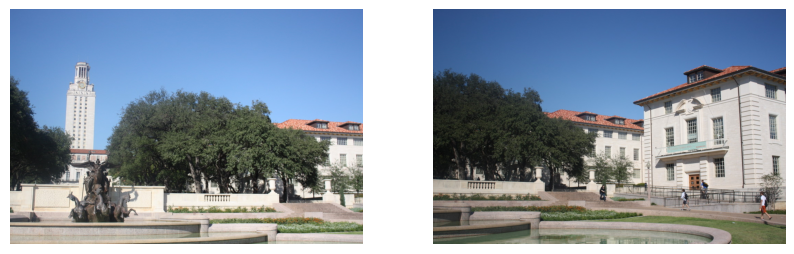

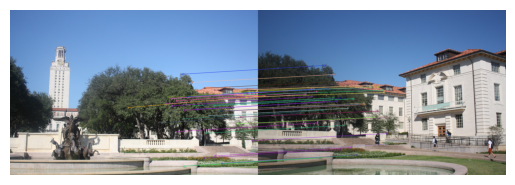

Calculated H
 [[ 1.29012454e+00 -7.46345485e-02 -5.70358415e+02]
 [ 1.66984726e-01  1.21135532e+00 -1.65497059e+02]
 [ 2.70297884e-04  2.07980155e-05  1.00000000e+00]]

Built-in Homography Matrix:
[[ 1.28820009e+00 -7.46759764e-02 -5.69291740e+02]
 [ 1.66348137e-01  1.20989483e+00 -1.64907038e+02]
 [ 2.68836960e-04  2.03604780e-05  1.00000000e+00]]



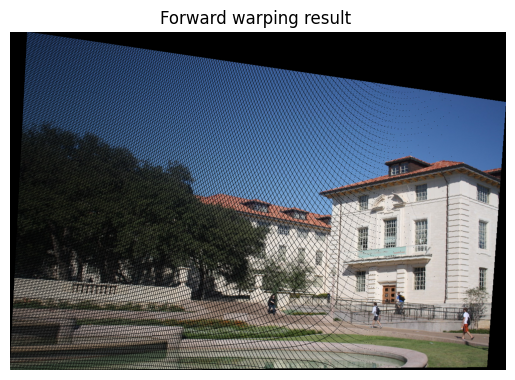

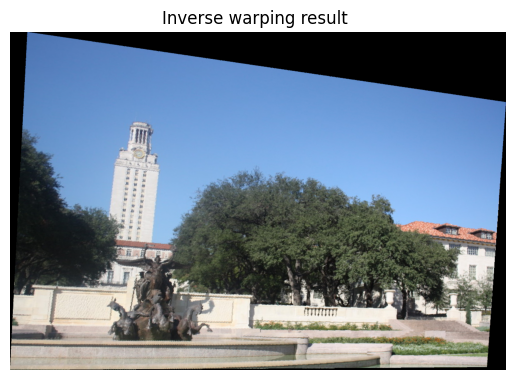

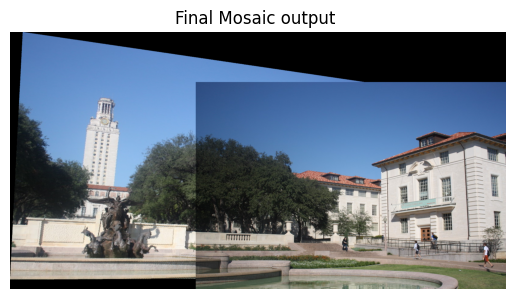

In [38]:
image1= cv2.imread("/kaggle/input/augmented-reality-video/pano_image2.jpg")
image2= cv2.imread("/kaggle/input/augmented-reality-video/pano_image1.jpg")
first=final_stitch_steps(image1,image2)

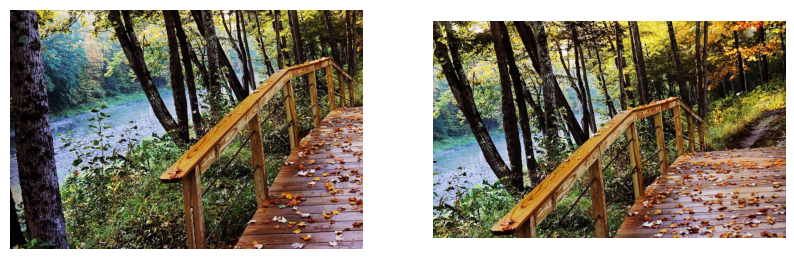

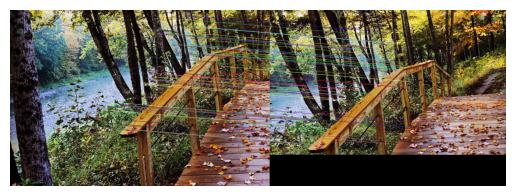

Calculated H
 [[ 1.00005014e+00  1.21596459e-05 -2.63022695e+02]
 [ 1.65814418e-05  9.99976543e-01  5.69995152e+01]
 [ 4.63941832e-08 -5.69583419e-08  1.00000000e+00]]

Built-in Homography Matrix:
[[ 1.00004889e+00  1.15946390e-05 -2.63022079e+02]
 [ 1.62460204e-05  9.99975445e-01  5.69997425e+01]
 [ 4.55213343e-08 -5.79676987e-08  1.00000000e+00]]



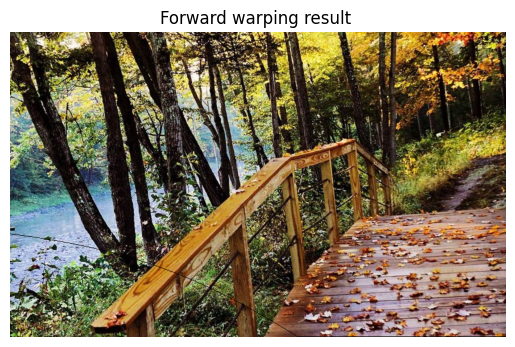

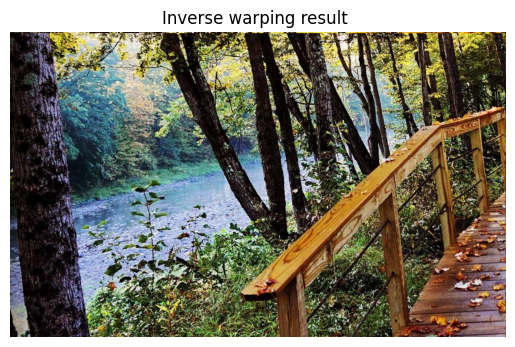

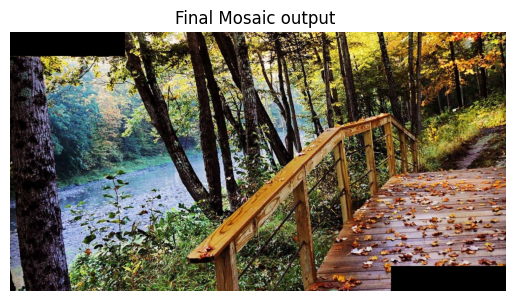

In [39]:
image1_ex2= cv2.imread("/kaggle/input/augmented-reality-video/ex2_1.jpg")
image2_ex2= cv2.imread("/kaggle/input/augmented-reality-video/ex2_2.jpg")
second=final_stitch_steps(image2_ex2,image1_ex2)

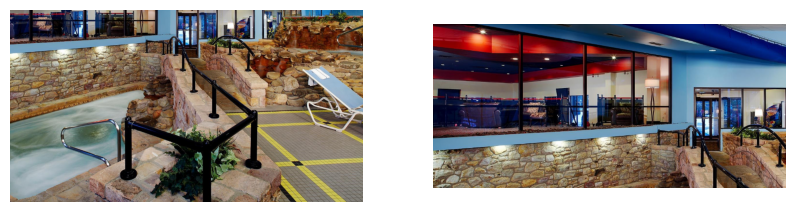

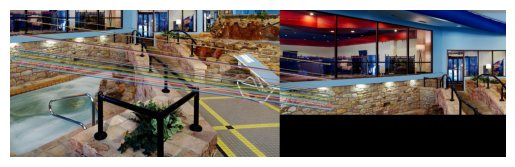

Calculated H
 [[ 9.99999202e-01  1.14383674e-07  1.54999999e+02]
 [-1.11707056e-06  1.00000008e+00  1.70000011e+02]
 [-4.06977695e-09  5.69876010e-10  1.00000000e+00]]

Built-in Homography Matrix:
[[ 9.99999916e-01  6.07703616e-08  1.54999998e+02]
 [ 6.97068103e-08  1.00000007e+00  1.69999995e+02]
 [-4.94704918e-10  2.79052011e-10  1.00000000e+00]]



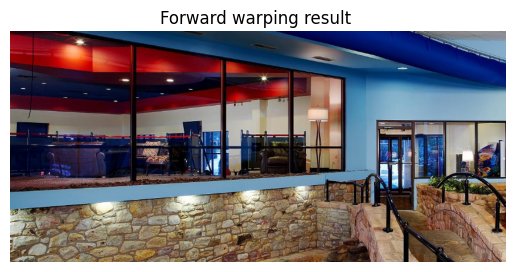

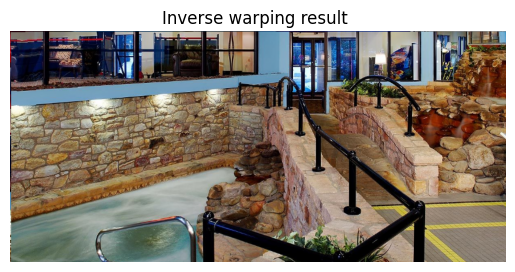

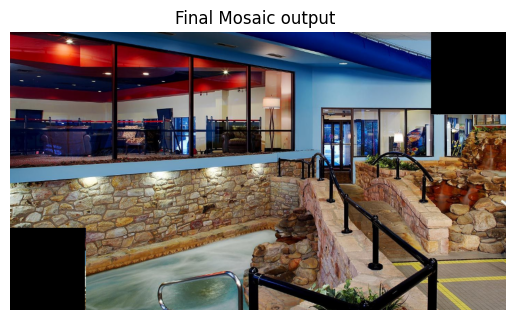

In [40]:
image1_ex3= cv2.imread("/kaggle/input/augmented-reality-video/ex3_1.png")
image2_ex3= cv2.imread("/kaggle/input/augmented-reality-video/ex3_2.png")
second=final_stitch_steps(image2_ex3,image1_ex3)

# BONUS

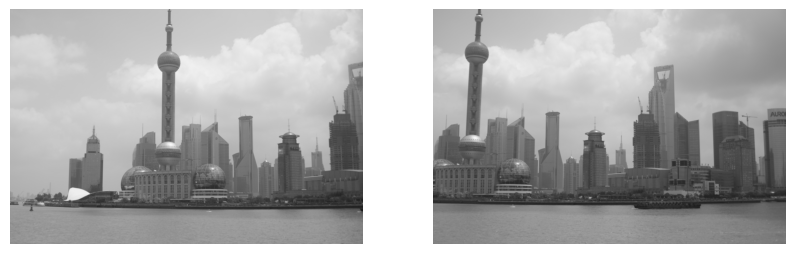

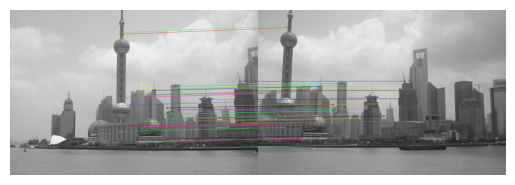

Calculated H
 [[ 1.12389881e+00 -4.08521680e-02 -3.77683782e+02]
 [ 8.30650346e-02  1.08684406e+00 -7.03959921e+01]
 [ 1.24410753e-04  1.83574475e-06  1.00000000e+00]]

Built-in Homography Matrix:
[[ 1.12352067e+00 -4.10010034e-02 -3.77456234e+02]
 [ 8.29591741e-02  1.08663038e+00 -7.03401636e+01]
 [ 1.24205145e-04  1.56405277e-06  1.00000000e+00]]



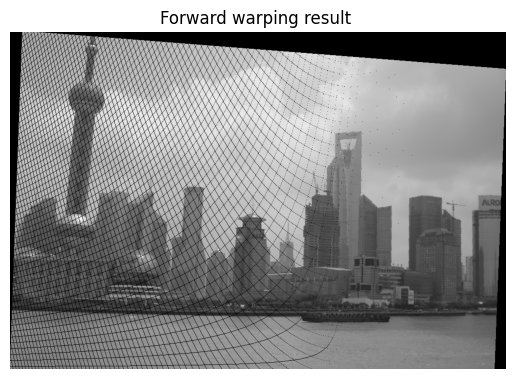

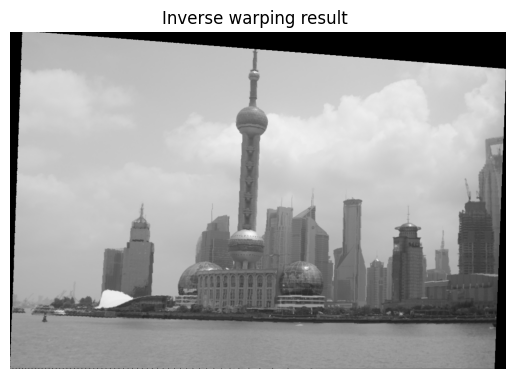

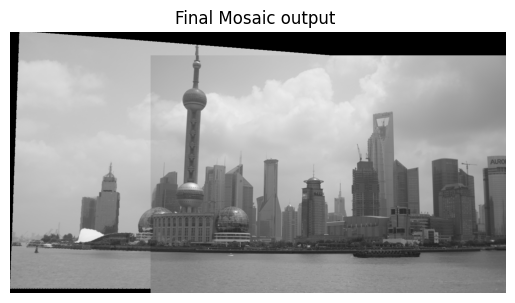

In [41]:
bonus_example1= cv2.imread("/kaggle/input/augmented-reality-video/shanghai-21.png")
bonus_example2= cv2.imread("/kaggle/input/augmented-reality-video/shanghai-22.png")
bonus_example3= cv2.imread("/kaggle/input/augmented-reality-video/shanghai-23.png")
first_stitch=final_stitch_steps(bonus_example1,bonus_example3)

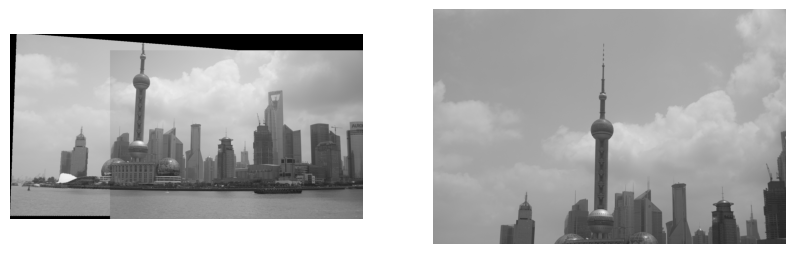

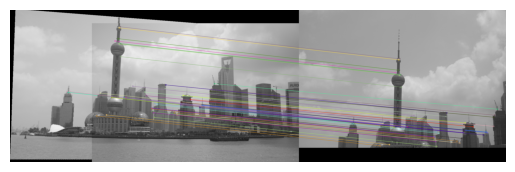

Calculated H
 [[ 8.19028370e-01 -1.20899577e-02  2.06831301e+01]
 [-9.00387076e-02  8.51848339e-01  2.03585035e+02]
 [-1.08805207e-04 -8.16195255e-05  1.00000000e+00]]

Built-in Homography Matrix:
[[ 8.20000183e-01 -1.14303979e-02  2.02583362e+01]
 [-9.00201681e-02  8.53254128e-01  2.03428131e+02]
 [-1.08475356e-04 -8.03426312e-05  1.00000000e+00]]



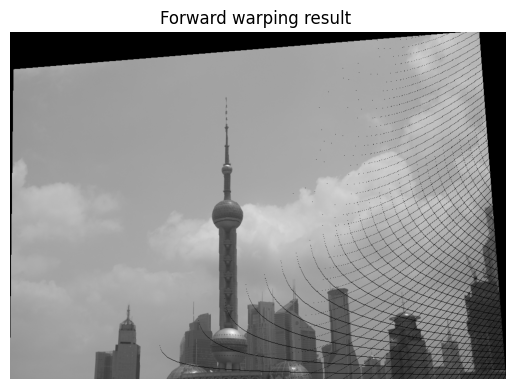

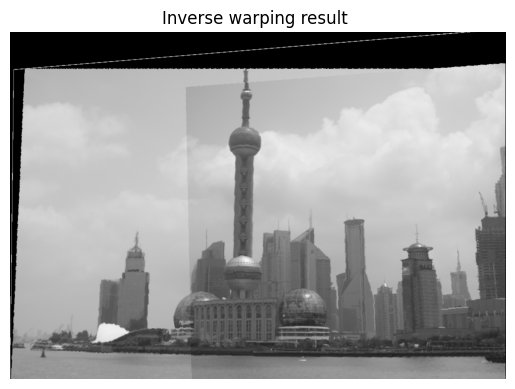

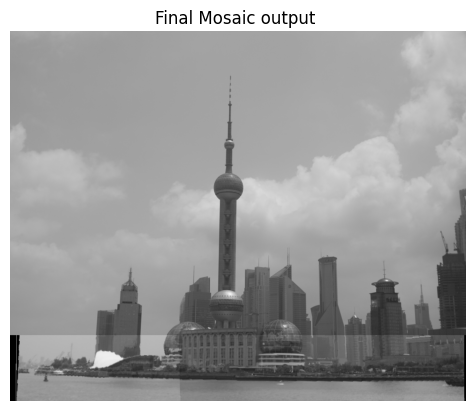

In [42]:
second_stitch=final_stitch_steps(first_stitch,bonus_example2)